# create database gis_hw

- we create a new database in postgresql.

- we need to install postgis like this

      sudo apt-get install postgis postgresql-10-postgis-2.5

- we want to use postgis. we run these commands when we connected to gis_hw

      CREATE EXTENSION postgis;
      CREATE EXTENSION postgis_topology;

- create tables of 'iran_country', 'iran_county', 'iran_states' and 'iran_inland_water' and insert data into these tables.

- for part 2, we use command like this for all tables:
       psql -h localhost -U postgres -d gis_hw -a -f ~/Desktop/DA/HW4/Iran_Inland_Water.sql

- after these parts, we have a ready database. we need to install qgis.

- we use this command to install qgis.

      sudo apt install gnupg software-properties-common
      wget -qO - https://qgis.org/downloads/qgis-2021.gpg.key | sudo gpg --no-default-keyring --keyring gnupg-ring:/etc/apt/trusted.gpg.d/qgis-archive.gpg --import
      sudo chmod a+r /etc/apt/trusted.gpg.d/qgis-archive.gpg
      sudo add-apt-repository "deb https://qgis.org/ubuntu $(lsb_release -c -s) main"
      sudo apt update
      sudo apt install qgis qgis-plugin-grass


# load iran_country, iran_county and iran_states in qgis

- after installing qgis, we load database in qgis.

- Open QGIS, select Layer -> Add layer -> Add PostGIS layers, it should open the interface to connect a PostGIS table.

- In the dialogue, click “New”, it should open the dialogue to configure the PostGIS server, and database (nyc1). Enter relevant information in Step 3, click Ok.

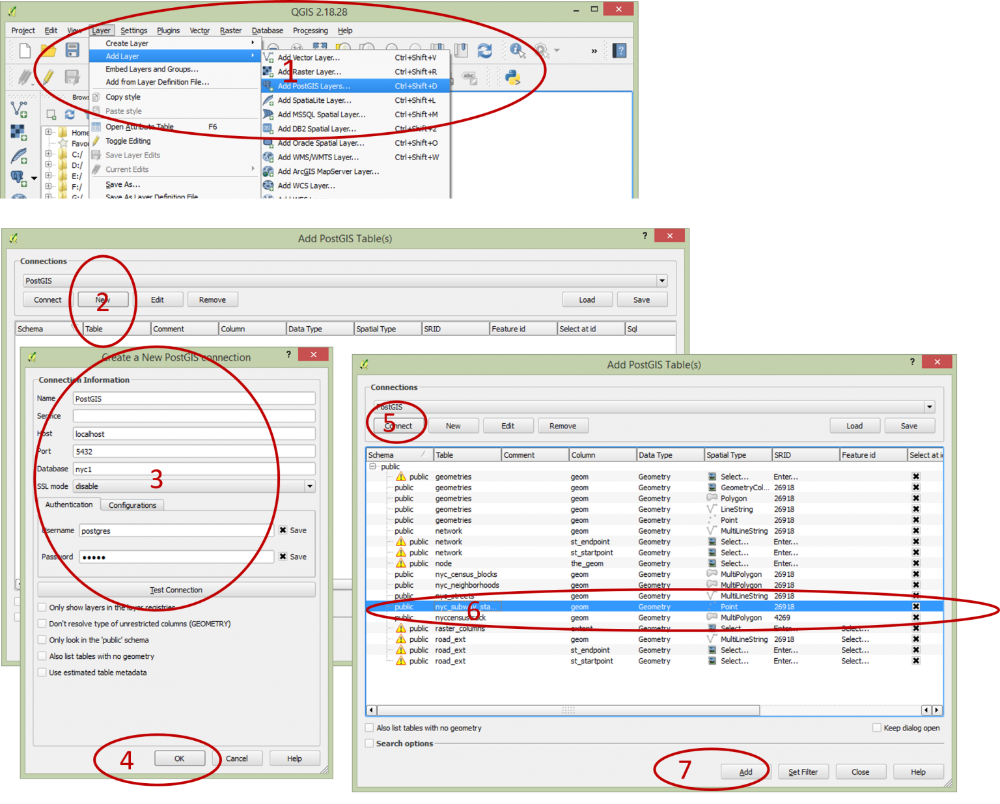

- Back to the dialogue, click “Connect”, you shall be able to see all tables in the database. You may select any table, click “Add”, then you can load it into the QGIS.

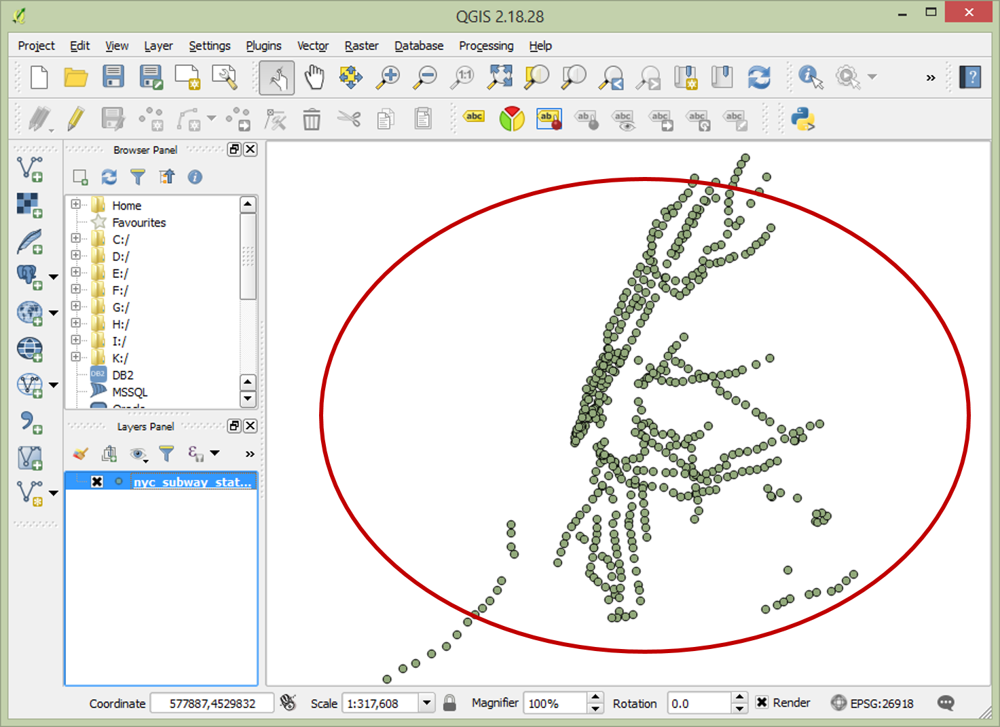

- first, we load iran_states in qgis. this is map of iran's provinces. result is here

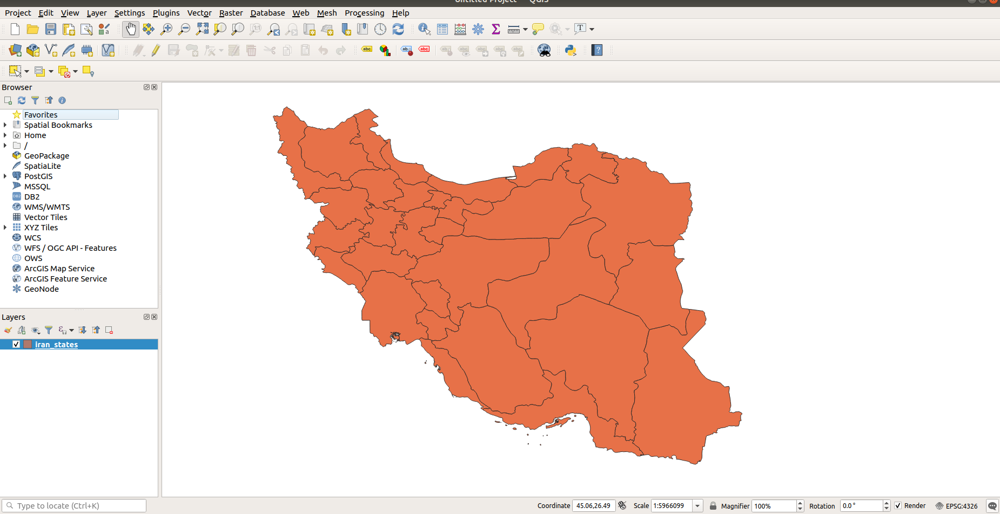


- second we load iran_country. this map is iran's map.

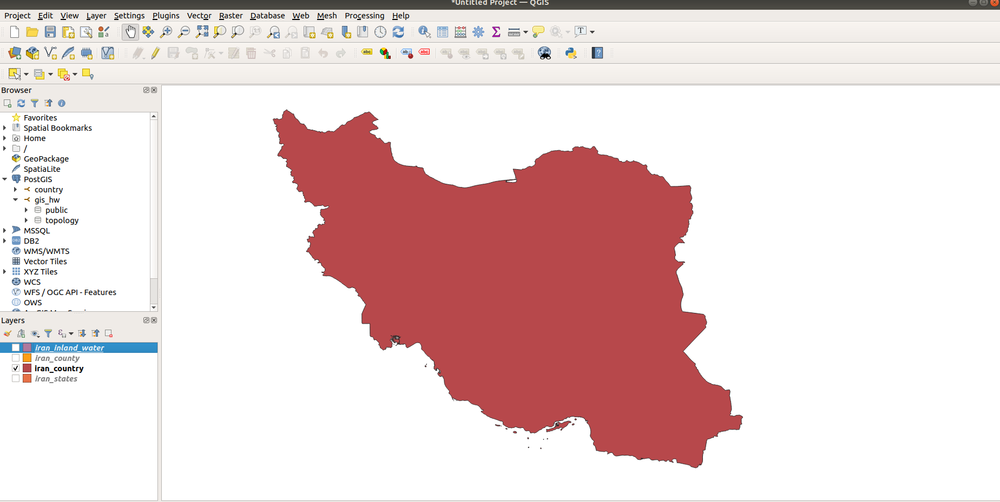

- we load iran_county. this is counties of iran.

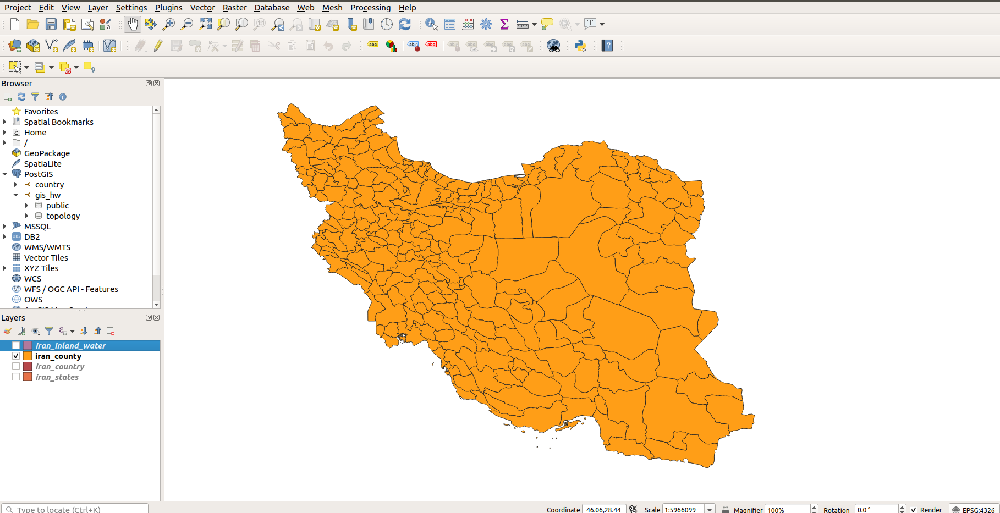

# use qgis to run sql query and find state and county of a location

- If you want to manage PostGIS database similar like pgAdmin, and visualize SQL results (e.g., buffer, intersection results) in the QGIS, click ‘Database’ drop-down menu, and open “DB Manager”, which should have similar interface and function like PgAdmin.

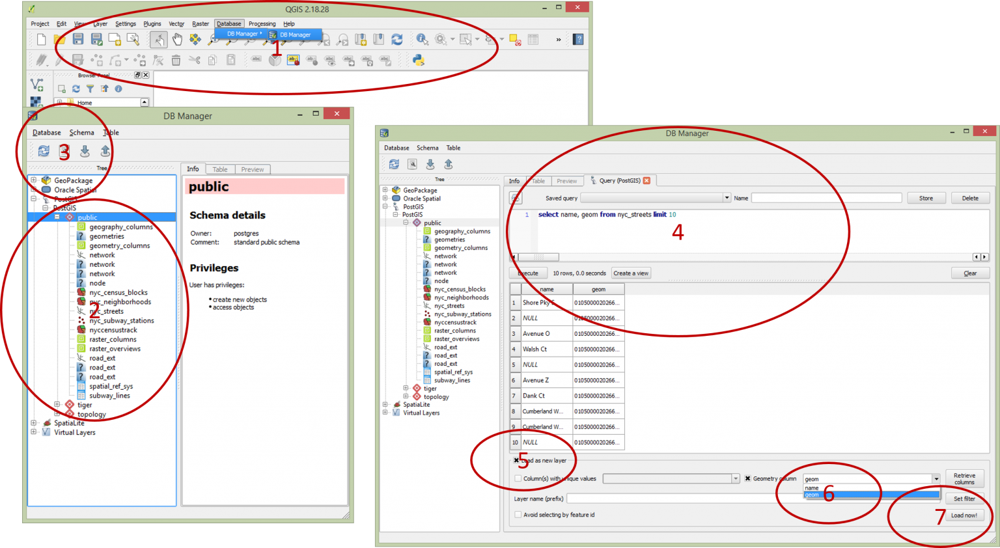

- Once open “DB manager” interface, you shall be able to see several spatial database systems in the left panel. Click “PostGIS”, you should be able to see all connected PostGIS tables displayed (Step 2).

- Select “SQL window” (Step 3), you should open the interface to enable to enter you SQL statements. In this example, you are randomly select 10 streets records “select name, geom from nyc_streets limited 10”.

- Click “Load as new layer” (Step 5), select the “geom” attribute to visualize, click “Load now”, you should be able to see these selected streets are visualized in the QGIS map area.

- You can also load and visualize more complex SQl queries. For example, you can generate 500 meter buffer for these streets, by entering “select name, st_buffer(geom, 500) as geom_buffer from nyc_streets limit 10” , and then load them as the map layer (Note: in the geometry column, you need to use the new buffer geometry “geom_buffer” as visualization column)

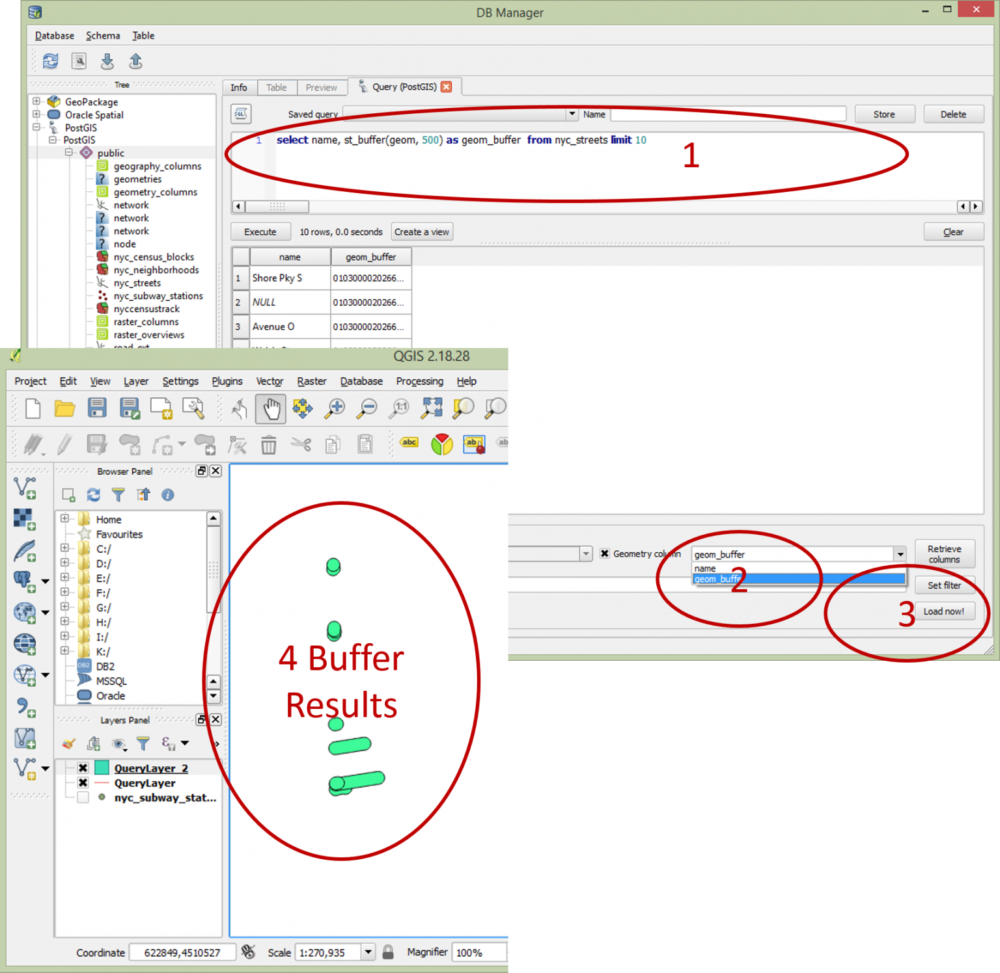

we use query like this

      select name_1 as state_name, name_2 as county_name
      from iran_county
      where ST_Intersects(ST_GeomFromText('POINT(51.3867718 35.7242345)',4326), wkb_geometry)
      limit 5;

result of sql is here

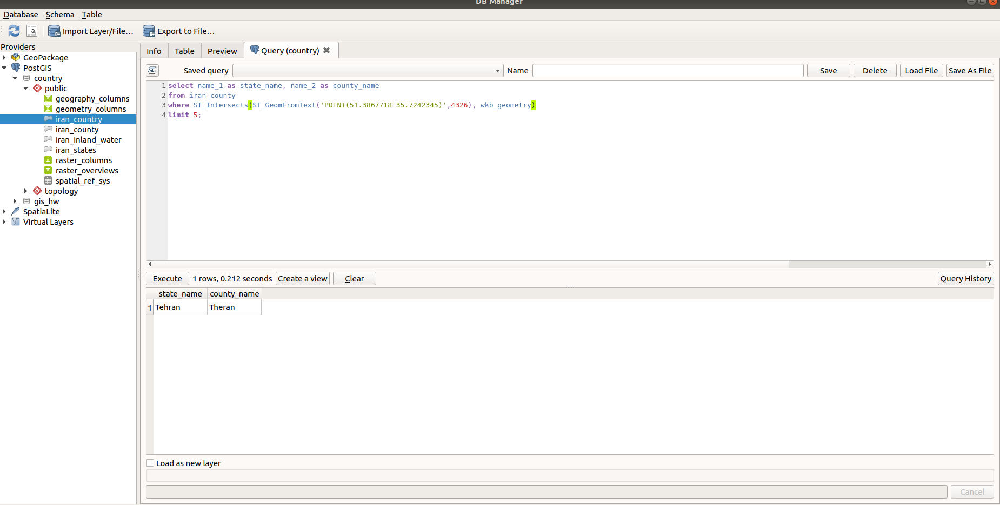

showing result on map is here

we use this query

    select *, name_1 as state_name, name_2 as county_name
    from iran_county
    where ST_Intersects(ST_GeomFromText('POINT(51.3867718 35.7242345)',4326), wkb_geometry)
    limit 5;

sql result is this

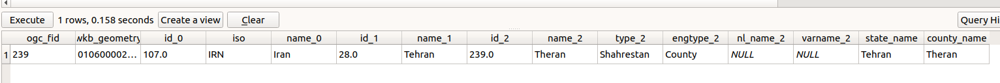

layer of result on map is here

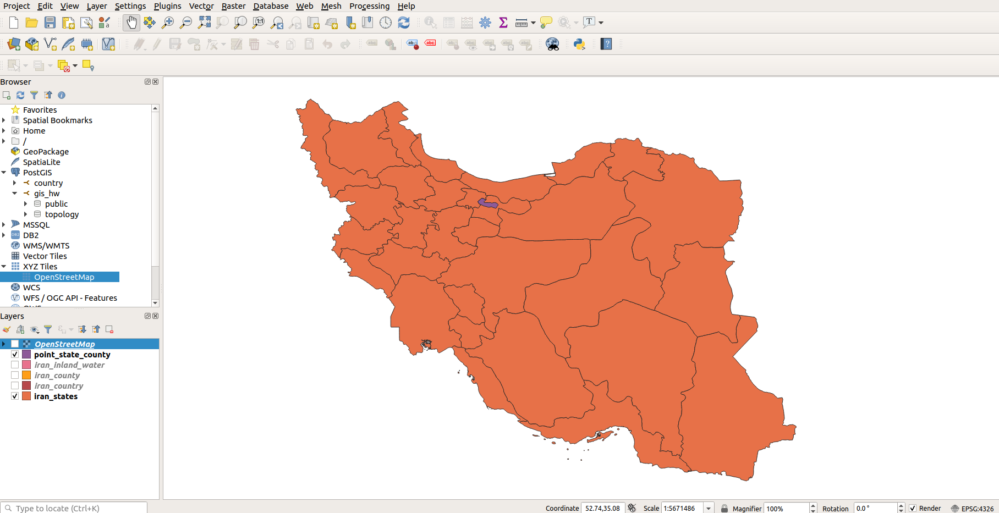

Purple indicates output. result is tehran in tehran county.

- here we show county that point is on with blue border on map. county is output of last sql.
- point of search is showed with black color.



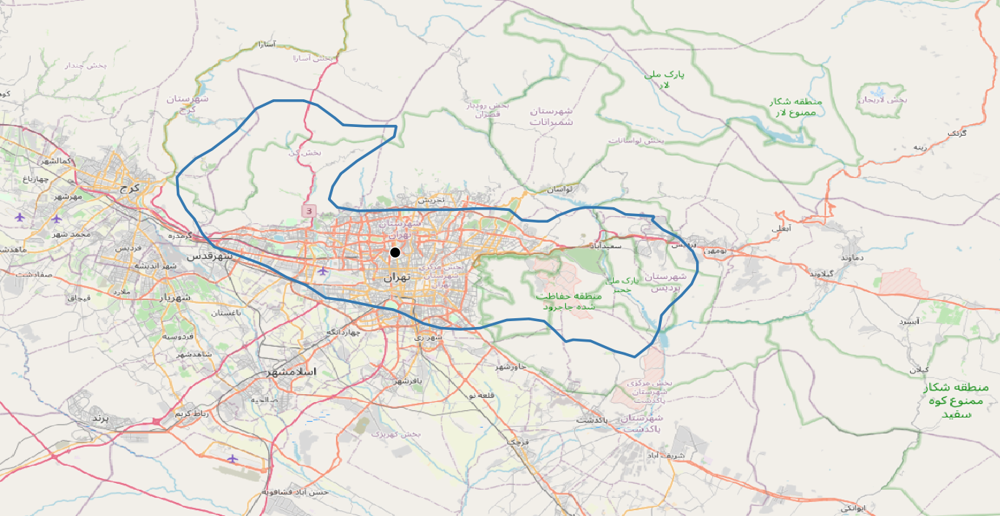

here we zoom in to show point location on map.

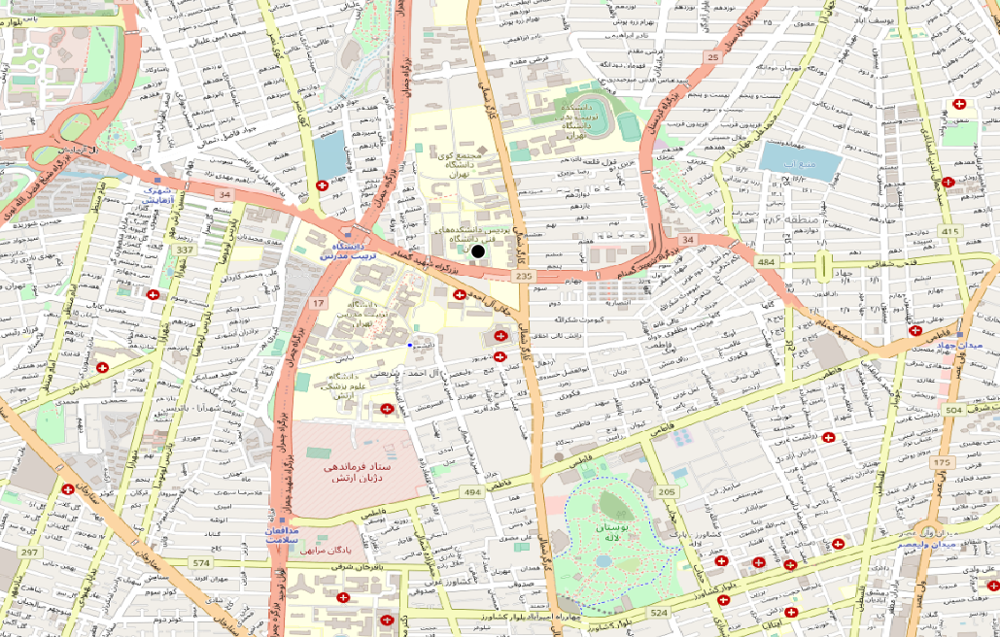

 sql for return point is here. output is showed as search_point_state_county layer.

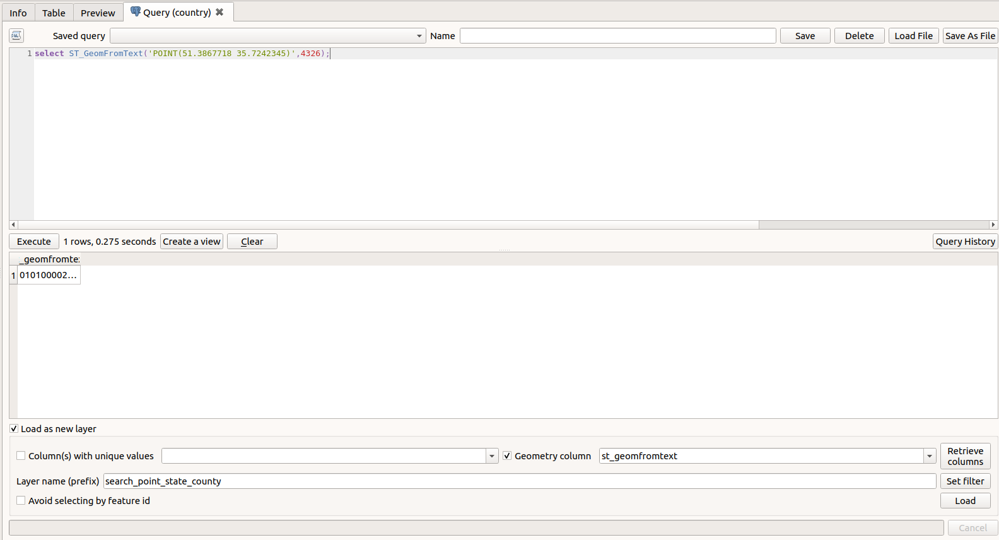

# load iran_inland_water in qgis

result of loading this database on states database is here. database has location of waters in iran.

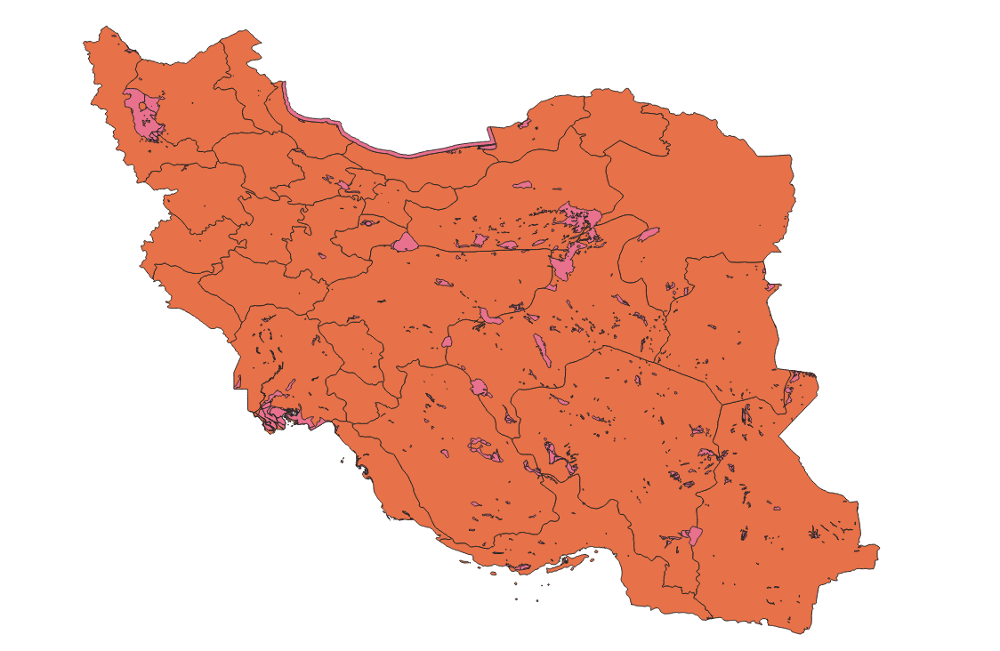

# find location of two point that are about waters in iran.

sql for find county and water of point(53.6166 31.0624)

find county. result is showed with blue border

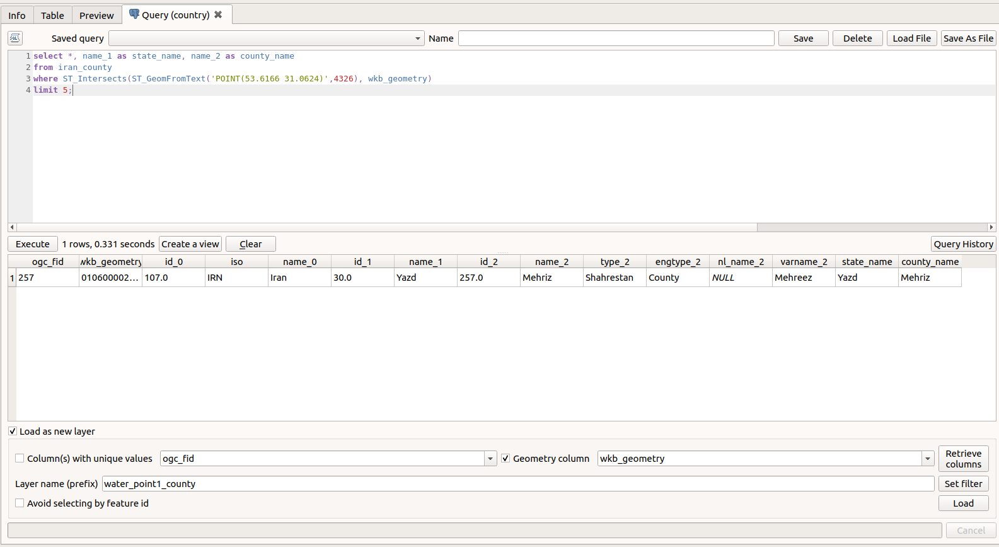

mehriz in yazd is result

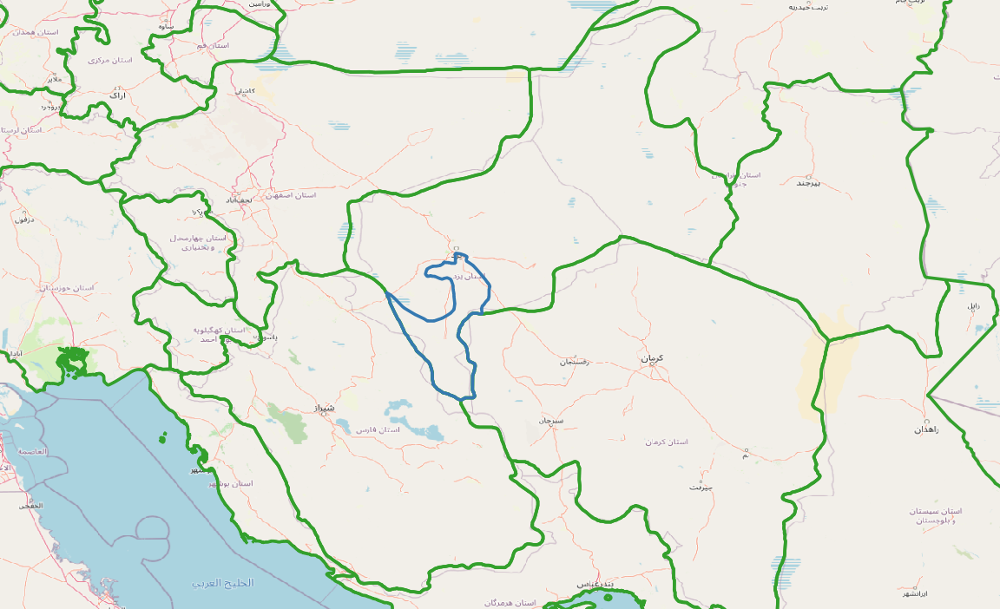

find water border. result is showed with black border

sql result is here

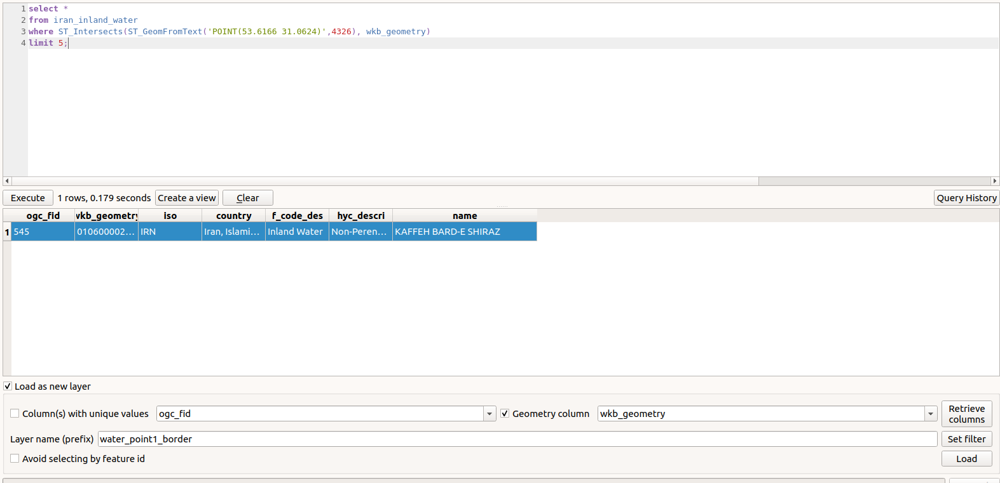

result showed as water_point1_border layer on map

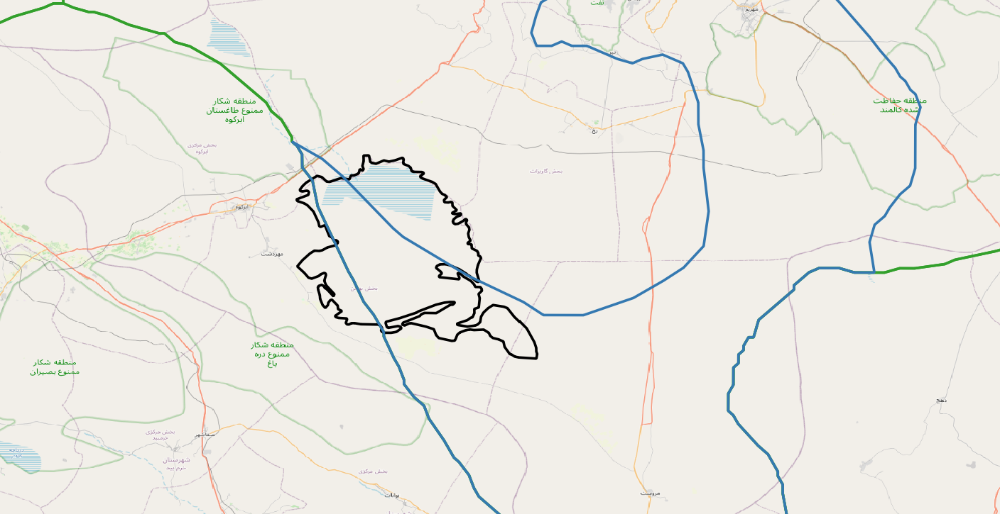

name of this lake is kaffeh bard-e shiraz. 

- sql for find county and water of point(61.2768 31.2736)

- sql for finding border of water is here. result is showed as water_point2_border layer. name of lake is hamun-e saberi.

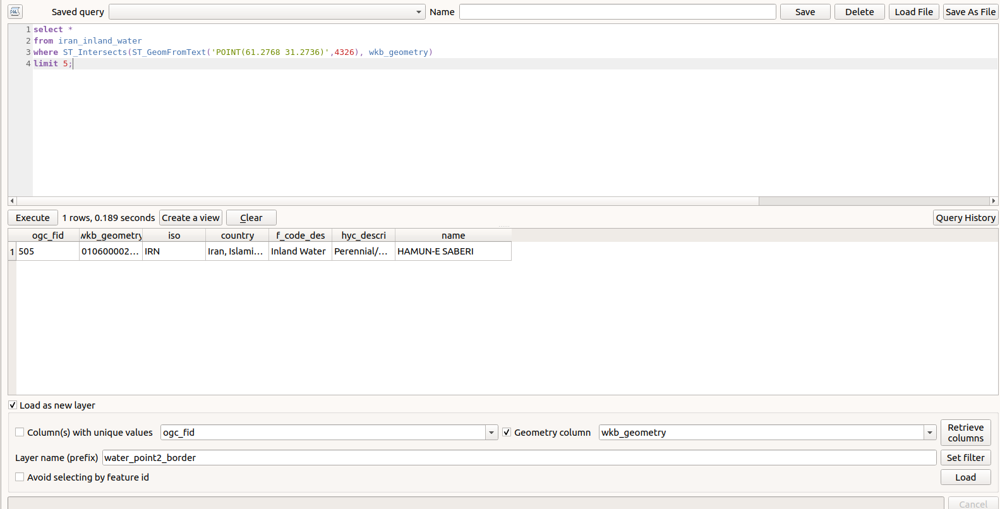

result layer is showed with black border on map.

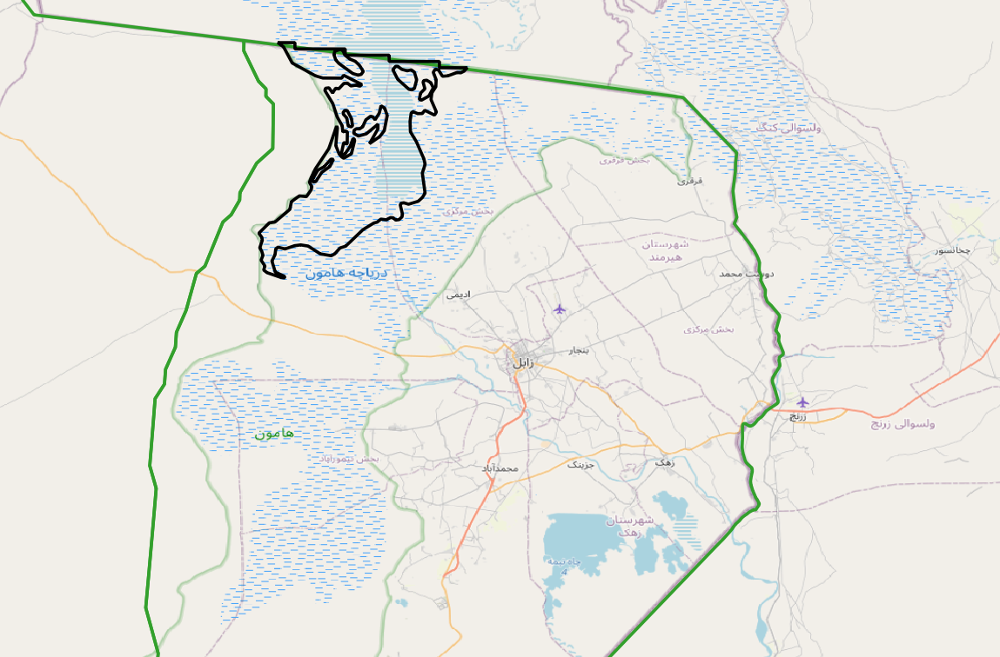

lake is near to hamun lake in iran.

sql result for country of point is here. result is showed as water_point2_county layer with blue border on map.

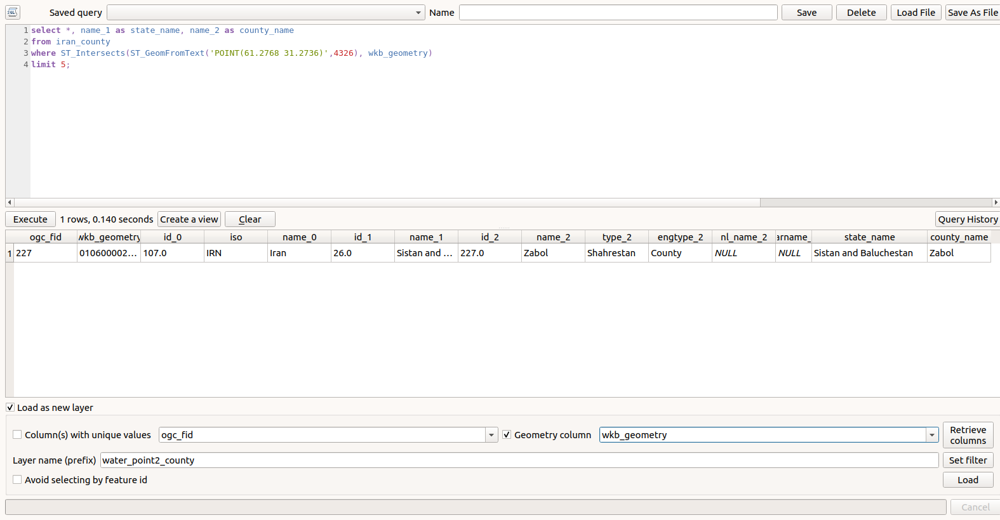

result is zabol in sistan and baluchestan. county border is blue on map.

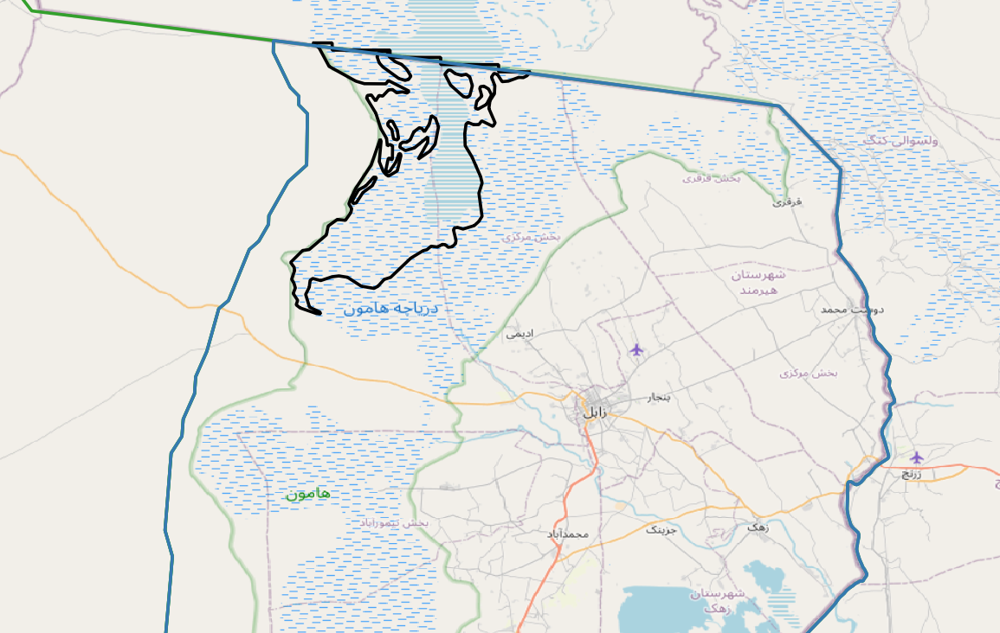

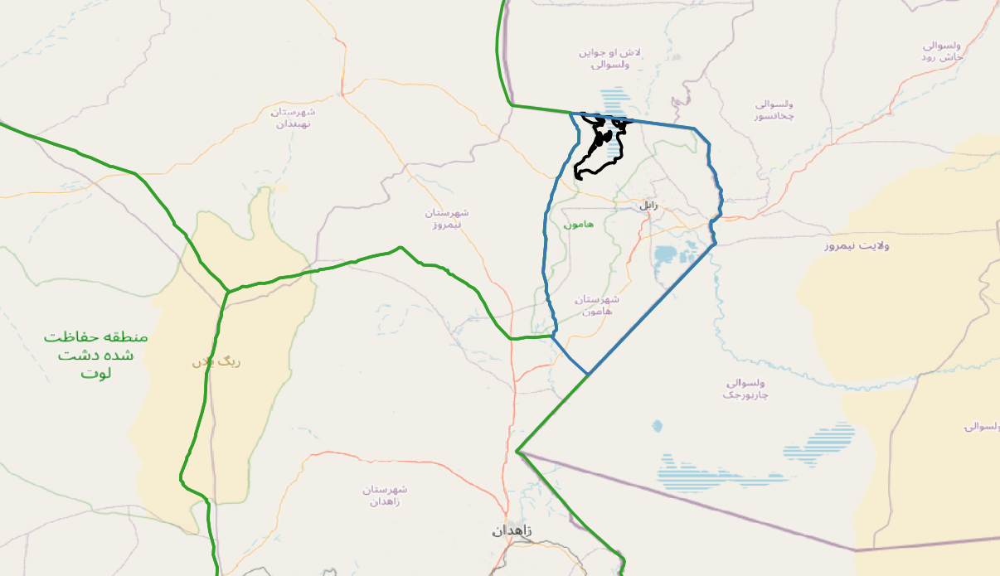